In [4]:
!pip install funcy pycocotools  scikit-multilearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.4/89.4 kB 12.2 MB/s eta 0:00:00


In [26]:
from typing import Union
from pathlib import Path
import warnings
import random
from pprint import pprint
from glob import glob
import json, shutil
import os, io, sys
import collections as cl
from math import trunc
from operator import itemgetter
from dataclasses import dataclass
from joblib import Parallel, delayed
from operator import itemgetter

from PIL import Image
import numpy as np
import cv2
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import KFold, GroupKFold
import funcy
from sklearn.model_selection import train_test_split
from skmultilearn.model_selection import iterative_train_test_split

from pycocotools.coco import COCO

In [27]:
PATH_COCO_JSON = '../sample/train_scale1_h640_w640_oh0.0_ow0.0_min1/_sahi_coco.json'
PATH_IMG = '../sample/train_scale1_h640_w640_oh0.0_ow0.0_min1'
OUTPUT = 'output/001/'

In [28]:
coco = COCO(PATH_COCO_JSON)
print()
cats = coco.loadCats(coco.getCatIds())
nms = [cat['name'] for cat in cats]
print('Sorabatake COCO Car categories: \n{}\n'.format(' '.join(nms)))

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!

Sorabatake COCO Car categories: 
car



In [33]:
catIds = coco.getCatIds(catNms=['car']);
imgIds = coco.getImgIds(catIds=catIds);
image_idx = 5
imgIds = coco.getImgIds(imgIds=[image_idx])
img_info = coco.loadImgs(imgIds[0])[0]
print(img_info)

{'height': 640, 'width': 640, 'id': 5, 'file_name': 'maxar_001_0_640_640_1280.jpg'}


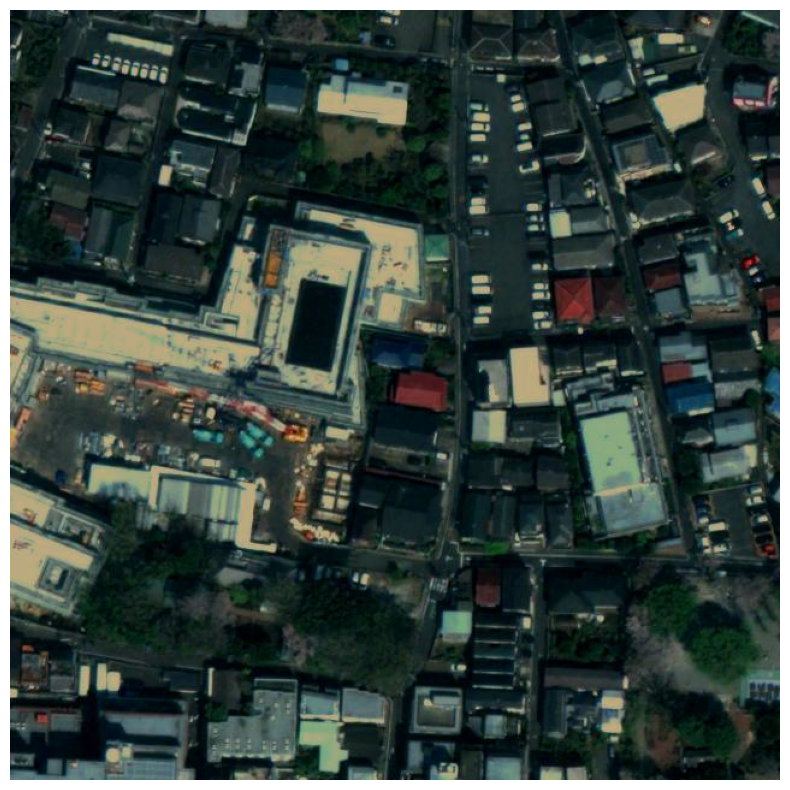

In [40]:
img = cv2.imread(f'{PATH_IMG}/{img_info["file_name"]}')

os.makedirs(OUTPUT, exist_ok=True)

plt.figure(figsize=(8, 8), facecolor='white')
plt.axis('off')
plt.imshow(img)
plt.tight_layout()
plt.savefig(f'{OUTPUT}visualize_coco_sorabatake_car.png', format='png')
plt.show();

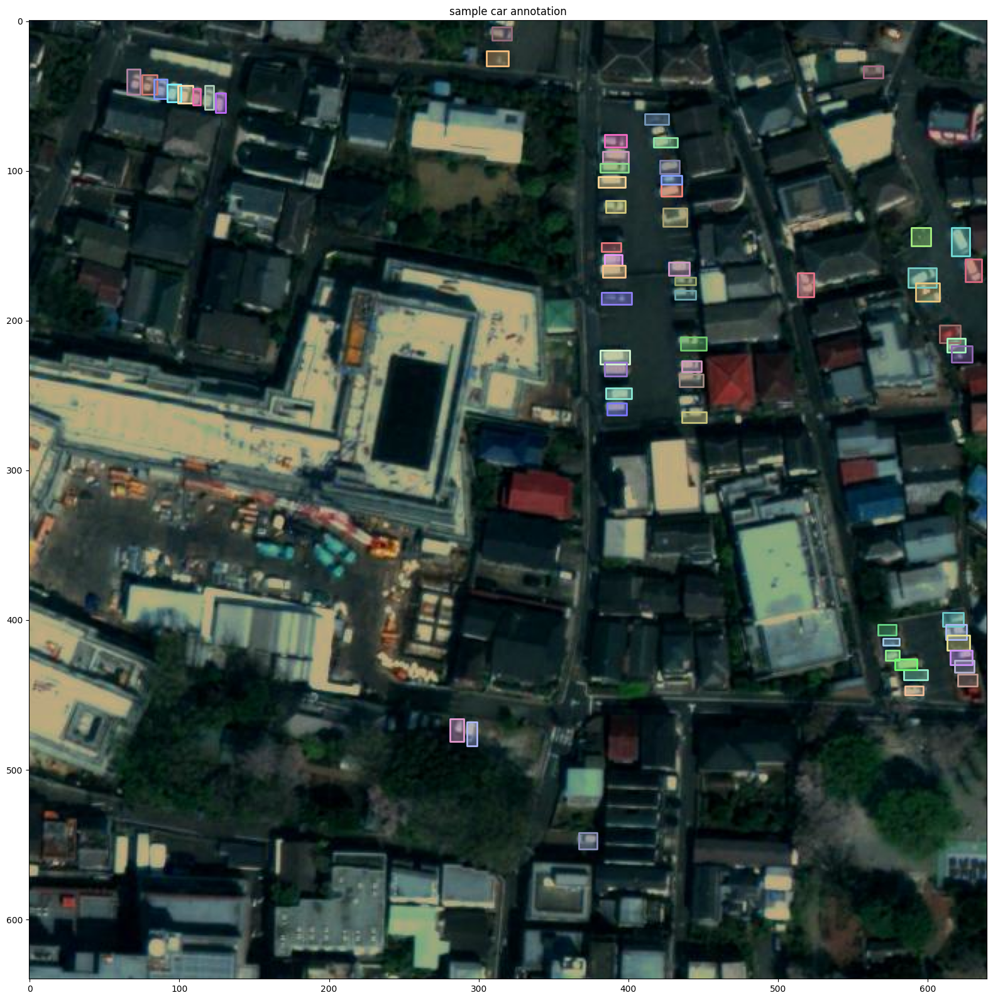

In [41]:
plt.figure(figsize=(16, 16), facecolor='white')
plt.title('sample car annotation')
plt.imshow(img);
annIds = coco.getAnnIds(imgIds=img_info['id'], catIds=catIds, iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)
os.makedirs(OUTPUT, exist_ok=True)
plt.tight_layout()
plt.savefig(f'{OUTPUT}visualize_coco_car_image_annotation.png', format='png')

{'height': 640, 'width': 640, 'id': 1, 'file_name': 'maxar_001_0_0_640_640.jpg'}
{'height': 640, 'width': 640, 'id': 2, 'file_name': 'maxar_001_640_0_1280_640.jpg'}
{'height': 640, 'width': 640, 'id': 3, 'file_name': 'maxar_001_1280_0_1920_640.jpg'}
{'height': 640, 'width': 640, 'id': 4, 'file_name': 'maxar_001_1804_0_2444_640.jpg'}
{'height': 640, 'width': 640, 'id': 5, 'file_name': 'maxar_001_0_640_640_1280.jpg'}
{'height': 640, 'width': 640, 'id': 6, 'file_name': 'maxar_001_640_640_1280_1280.jpg'}
{'height': 640, 'width': 640, 'id': 7, 'file_name': 'maxar_001_1280_640_1920_1280.jpg'}


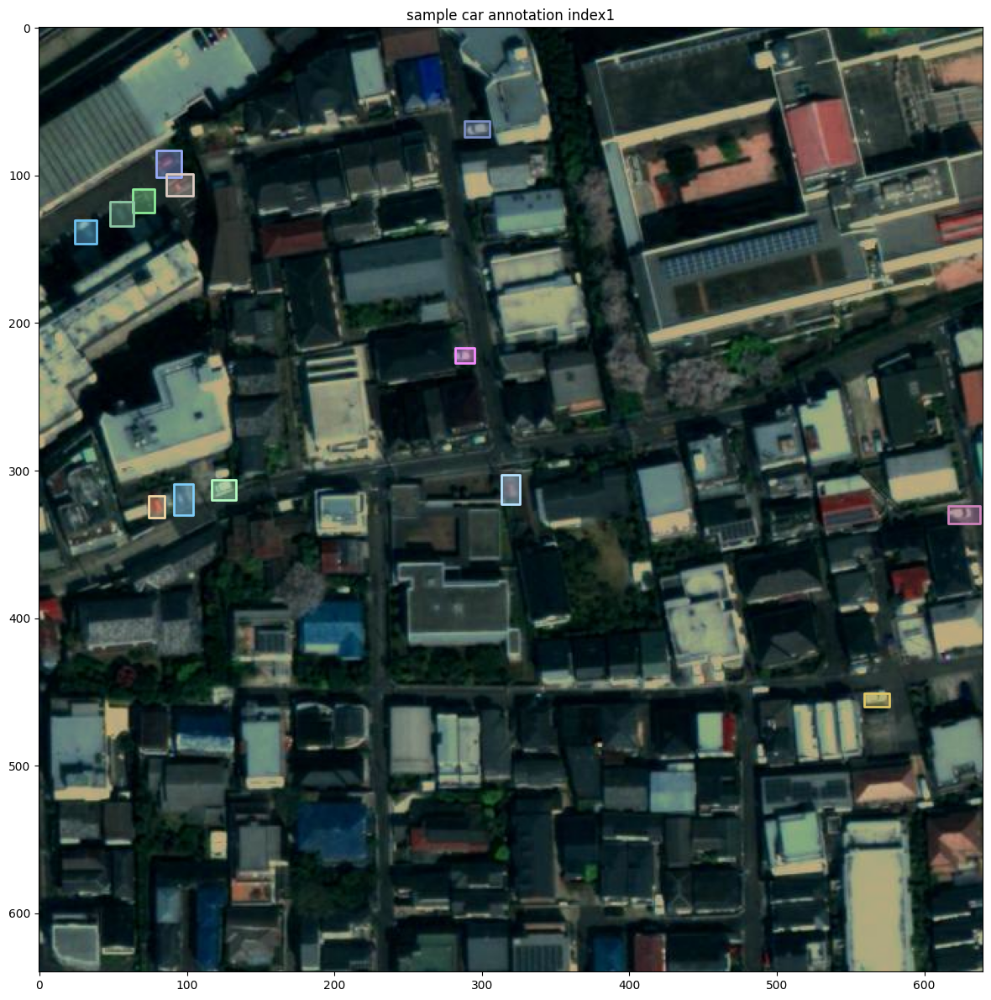

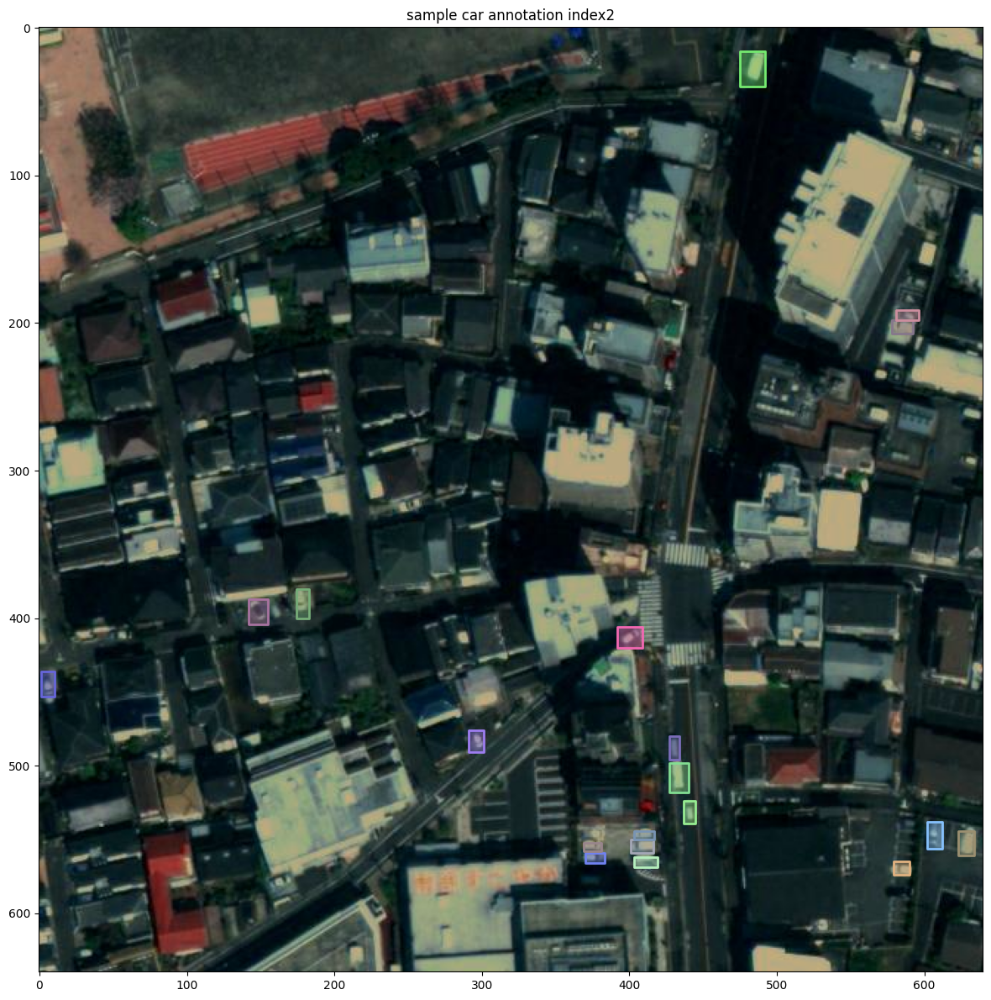

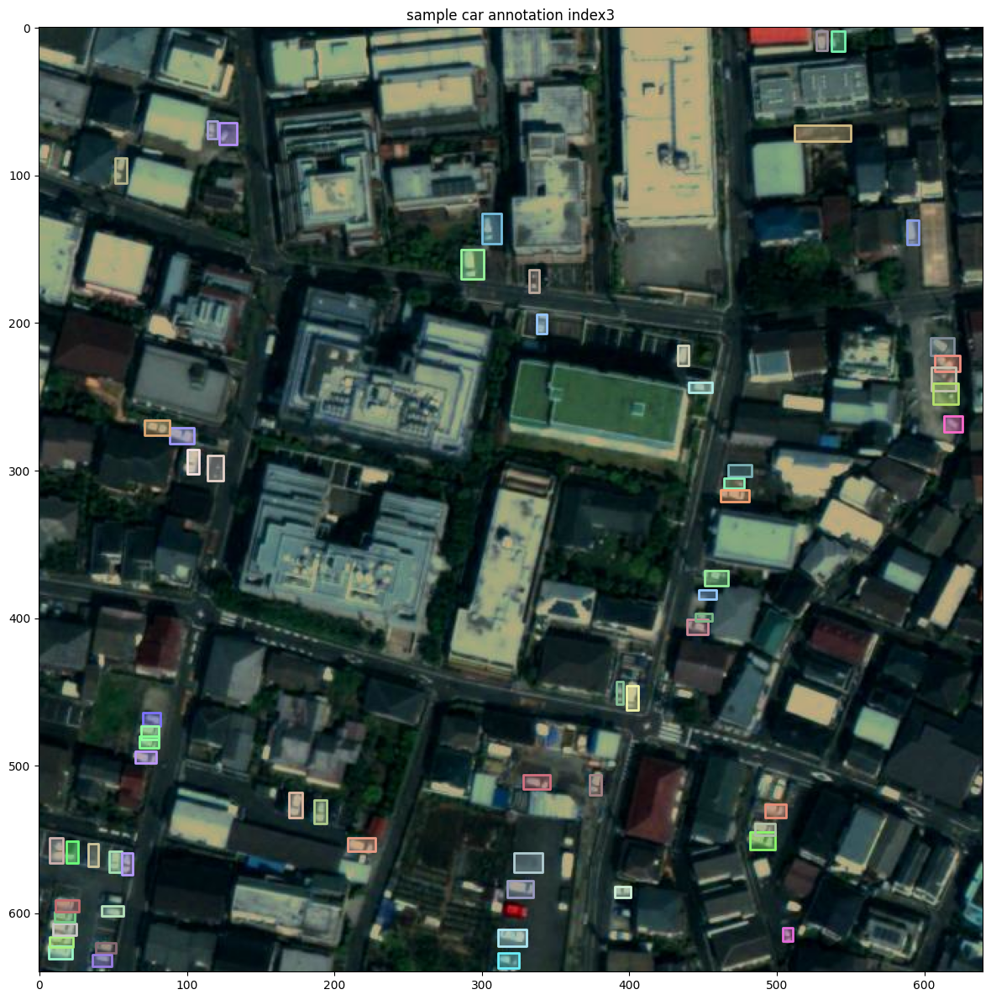

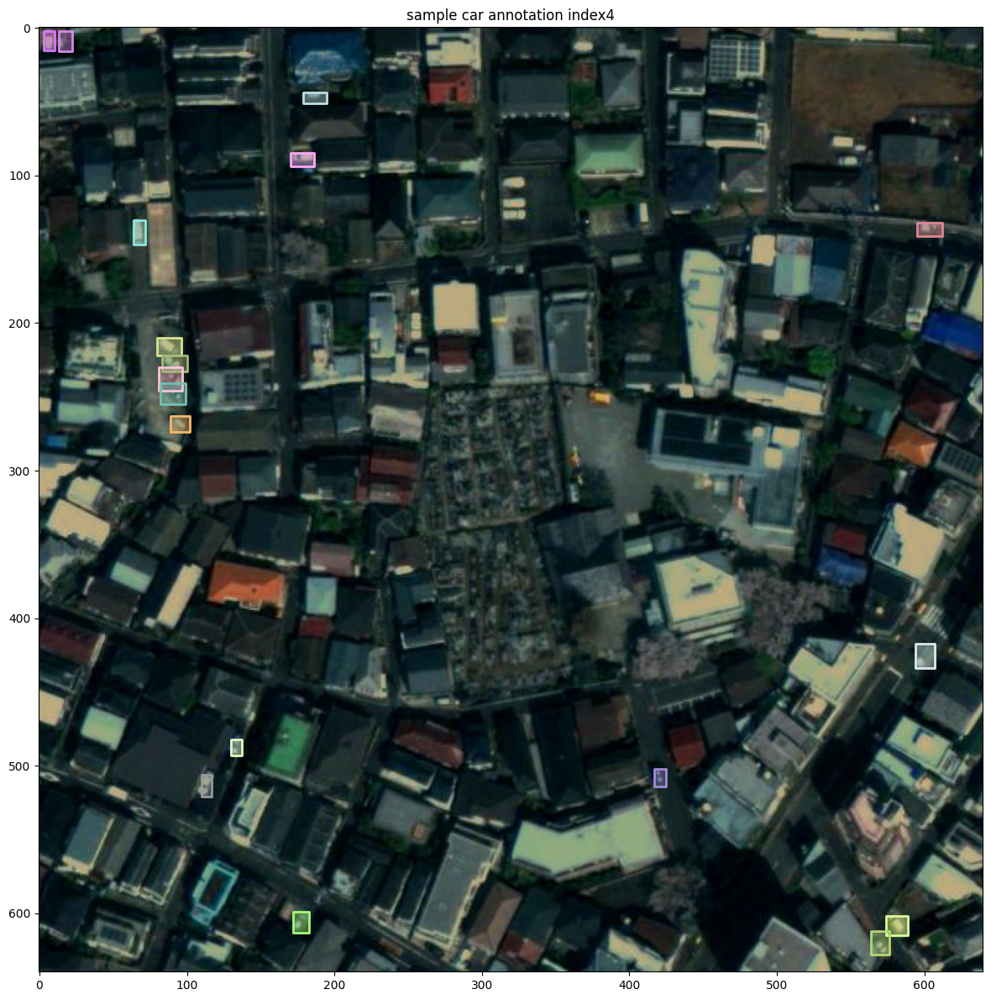

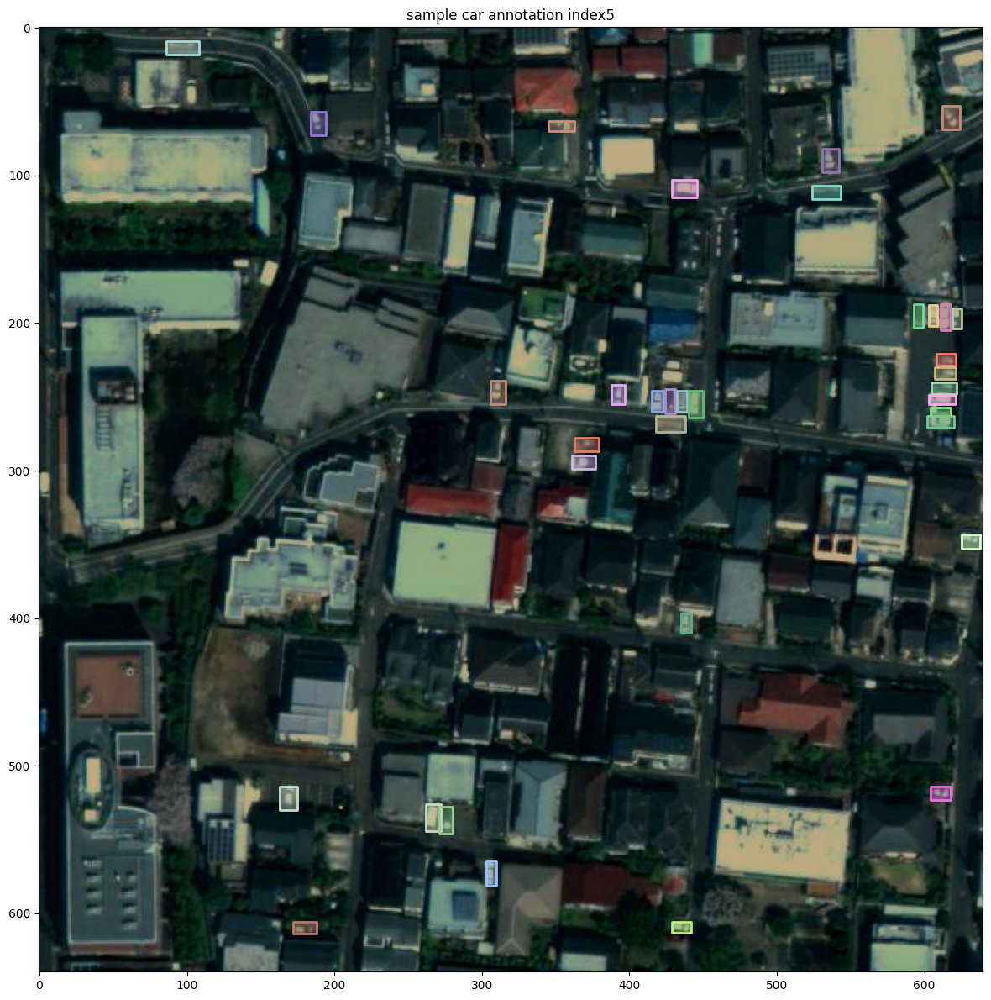

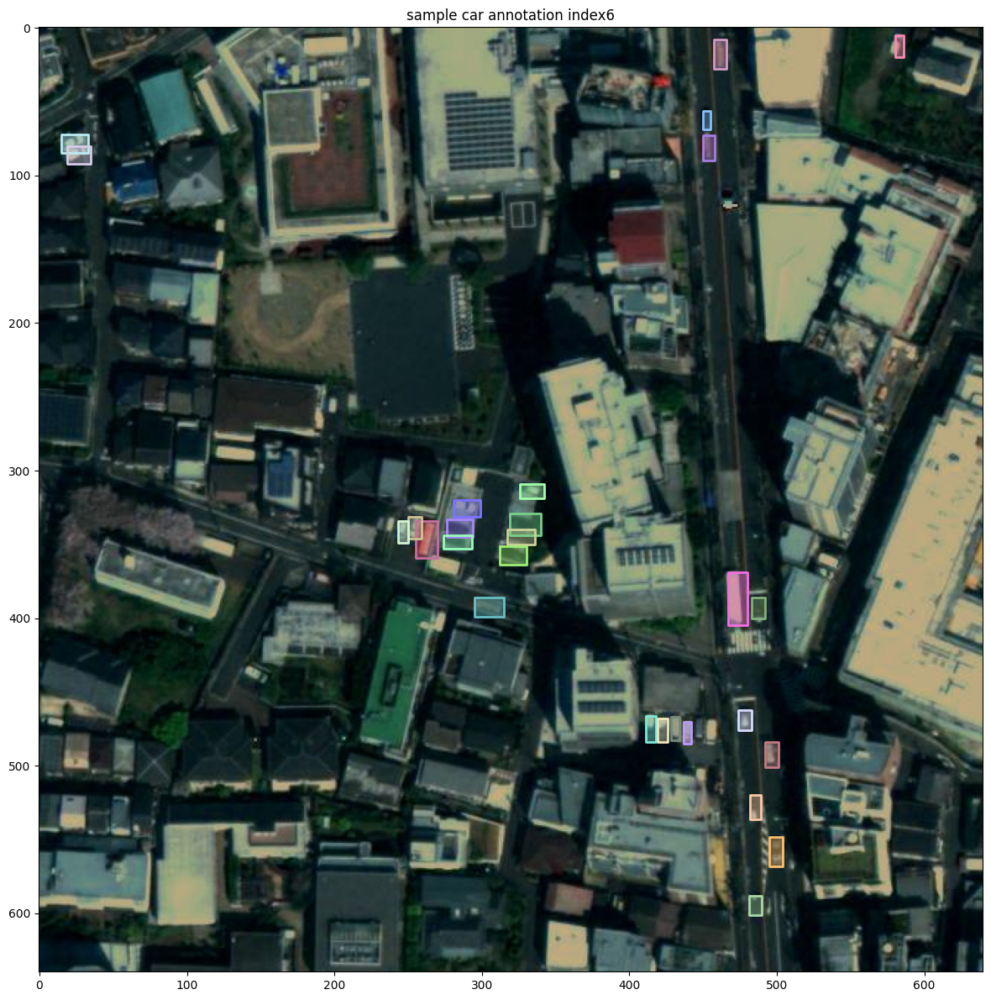

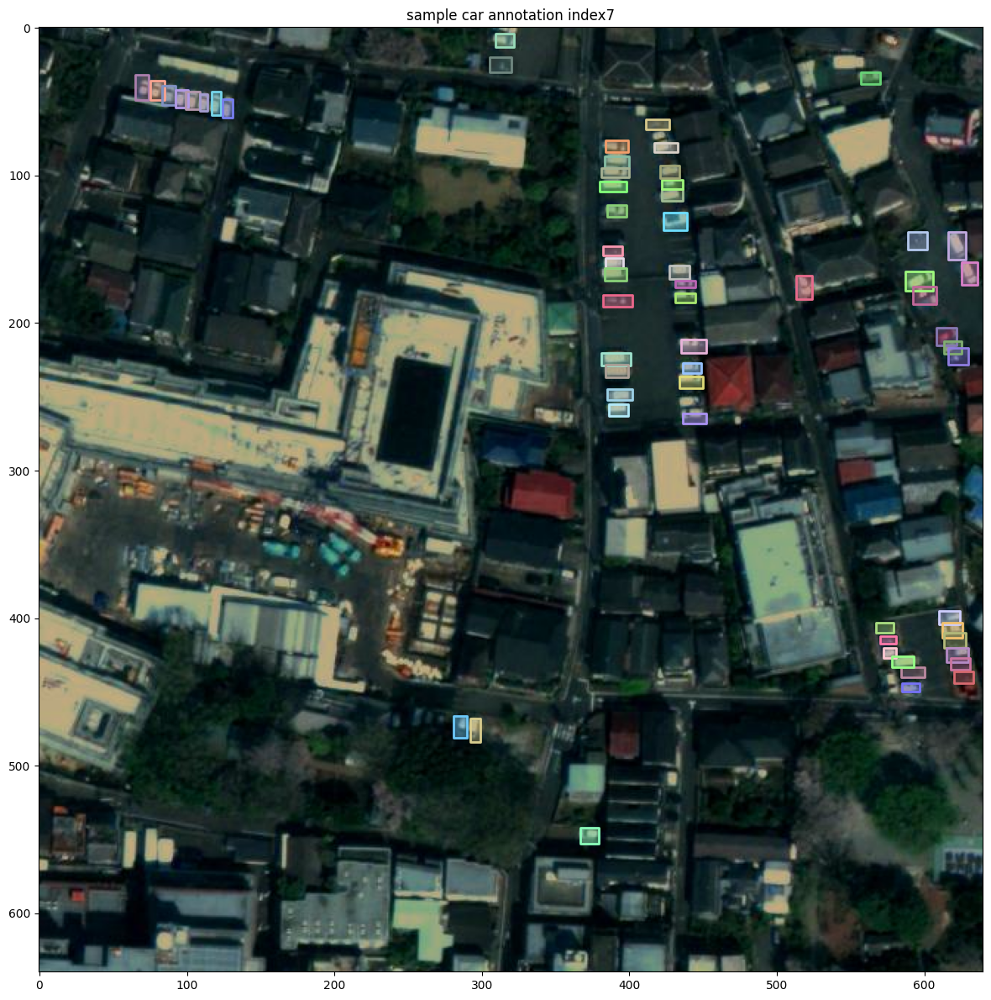

In [39]:
for image_idx in range(1, 8):

    imgIds = coco.getImgIds(imgIds=[image_idx])
    img_info = coco.loadImgs(imgIds[0])[0]
    print(img_info)

    plt.figure(figsize=(12, 12), facecolor='white')
    plt.title(f'sample car annotation index{image_idx}')
    img = cv2.imread(f'{PATH_IMG}/{img_info["file_name"]}')
    plt.imshow(img);
    annIds = coco.getAnnIds(imgIds=img_info['id'], catIds=catIds, iscrowd=None)
    anns = coco.loadAnns(annIds)
    coco.showAnns(anns)
    os.makedirs(OUTPUT, exist_ok=True)
    plt.tight_layout()
    plt.savefig(f'{OUTPUT}visualize_coco_car_sample_idx{image_idx}.png', format='png')

In [3]:
!python cocosplit/cocosplit.py --having-annotations --multi-class -s 0.8 \
    /workspace/sample/train_scale1_h640_w640_oh0.0_ow0.0_min1/_coco.json \
    /workspace/sample/train_scale1_h640_w640_oh0.0_ow0.0_min1/train.json \
    /workspace/sample/train_scale1_h640_w640_oh0.0_ow0.0_min1/valid.json

Saved 2004 entries in /workspace/sample/train_scale1_h640_w640_oh0.0_ow0.0_min1/train.json and 501 in /workspace/sample/train_scale1_h640_w640_oh0.0_ow0.0_min1/valid.json
